In [ ]:
!pip install google-search-results
from serpapi import GoogleSearch
from bs4 import BeautifulSoup
import requests
import cv2
import matplotlib.pyplot as plt
import dlib
import numpy as np


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for google-search-results: filename=google_search_results-2.4.2-py3-none-any.whl size=32002 sha256=279b0a216815ff16ed19e634fb3bcfabea950ef96a729e621de0f1e7a499e8ee
  Stored in directory: /root/.cache/pip/wheels/d3/b2/c3/03302d12bb44a2cdff3c9371f31b72c0c4e84b8d2285eeac53
Successfully built google-search-results


## **1)Read Frame by frame**




In [ ]:
cap = cv2.VideoCapture('project video.mp4')
# to read frame by frame
i = 0
while True:
  frame = cap.read()
  if frame[0] == False:
    break
  cv2.imwrite(f"frame{i}.jpg", frame[1])
  i += 1


## **Convert to RGB**

True

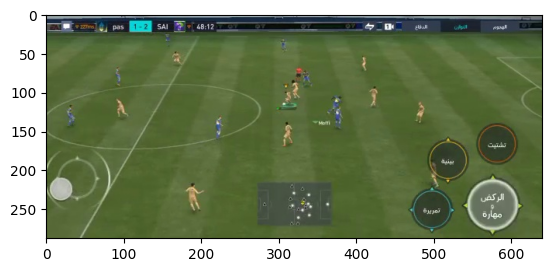

In [ ]:
img=cv2.imread(f'frame30.jpg')
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img2)
cv2.imwrite(f"image football.jpg",img2)

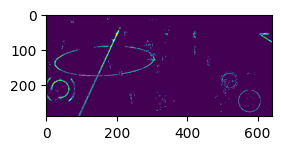

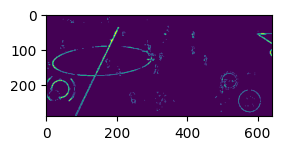

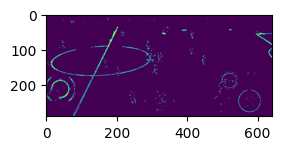

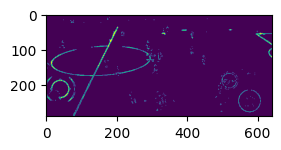

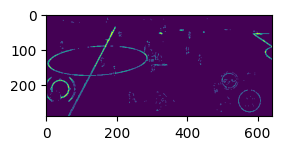

...

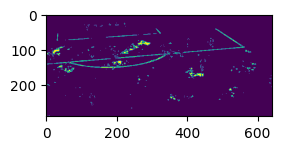

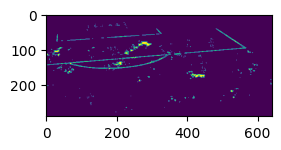

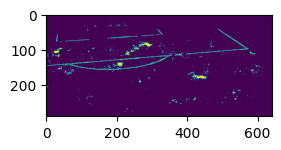

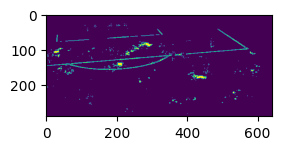

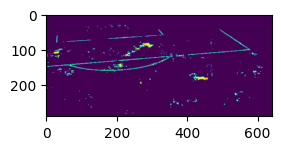

In [ ]:
lower = 103,121,73

upper = 143,162,113

for i in range(500):

        img2=cv2.imread(f'frame{i}.jpg')
        mask2 = cv2.cvtColor(img2,cv2.COLOR_BGR2RGB)
        m2=cv2.inRange(mask2, lower, upper)

        plt.subplot(1, 2, 2)
        plt.imshow(m2)
        plt.show()

## 3)**ball labeling**



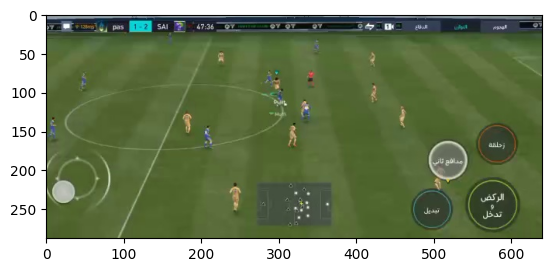

In [ ]:
img0=cv2.imread('frame0.jpg')
mask = cv2.cvtColor(img0,cv2.COLOR_BGR2RGB)
plt.imshow(mask)

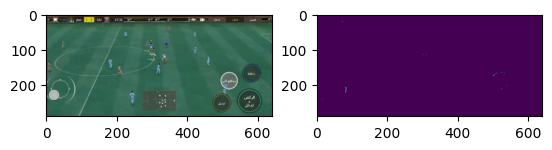

In [ ]:
lower = 194,212,172

upper = 210,228,186
maskt = cv2.inRange(mask, lower, upper)

plt.subplot(1, 2, 1)

plt.imshow(img0)

plt.subplot(1, 2, 2)

plt.imshow(maskt)

plt.show()

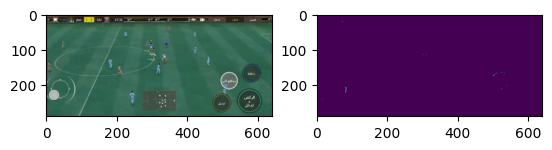

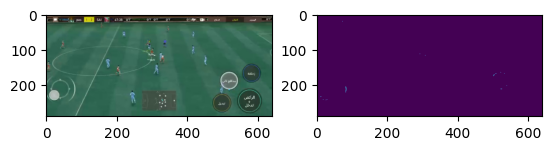

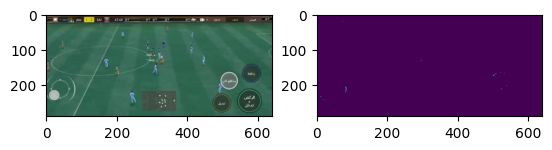

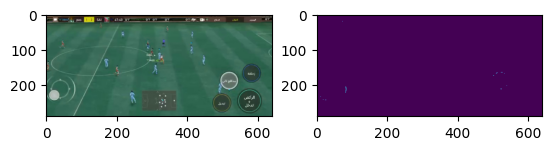

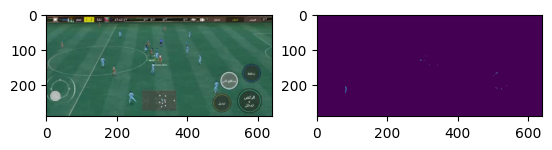

...

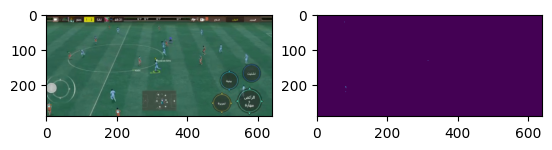

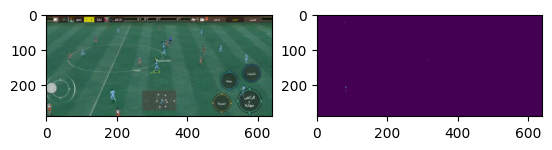

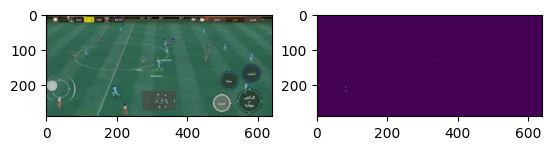

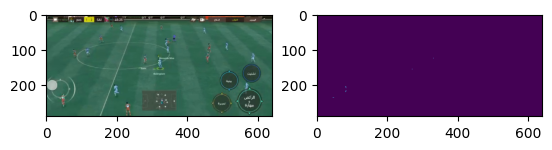

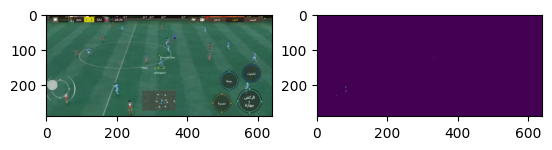

In [ ]:
lower = 194,212,172

upper = 210,228,186

for i in range(50):

        img=cv2.imread(f'frame{i}.jpg')
        mask = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
        m=cv2.inRange(mask, lower, upper)
        plt.subplot(1,2,1)
        plt.imshow(img)
        plt.subplot(1, 2, 2)
        plt.imshow(m)
        plt.show()

## **4)Feature Extracting**

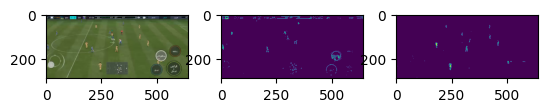

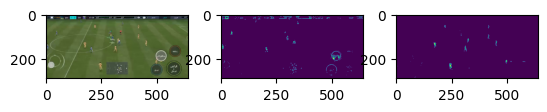

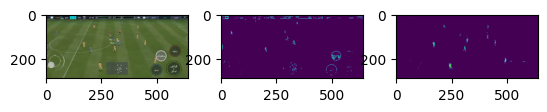

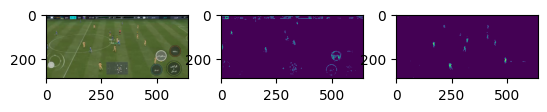

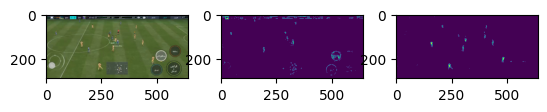

...

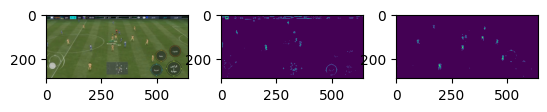

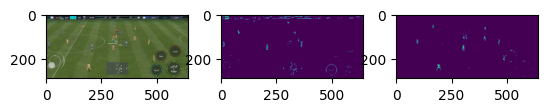

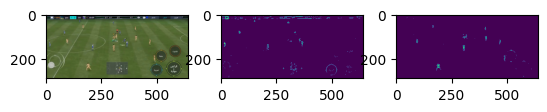

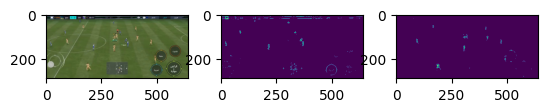

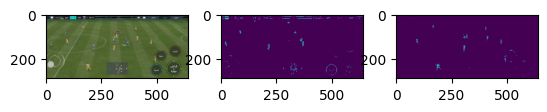

In [ ]:
# blue
lower =70,76,100
upper=129,141,146

# yellow
lower2 = 150,130,71
upper2 = 225,200,120

masksblue=[]
masksyellow=[]
for i in range(30):
        img=cv2.imread(f'frame{i}.jpg')
        img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        maskblue=cv2.inRange(img2, lower, upper)
        masksblue.append(maskblue)
        maskyellow=cv2.inRange(img2, lower2, upper2)
        masksyellow.append(maskyellow)
        plt.subplot(5, 3, 1)
        plt.imshow(img2)
        plt.subplot(5, 3, 2)
        plt.imshow(masksblue[i])
        plt.subplot(5, 3, 3)
        plt.imshow(masksyellow[i])
        plt.show()

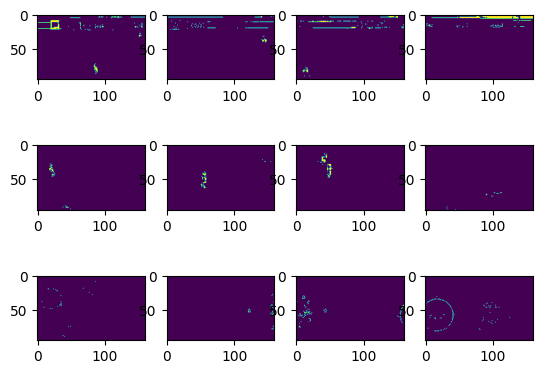

In [ ]:
width = maskblue.shape[1]
cx = width //4
height = maskblue.shape[0]
cy = height //3
crops = []
x = 0
y = 0
for j in range(3):
   for i in range(4):
       t = maskblue[y:y+cy , x:x+cx ]
       crops.append(t)
       x = x + cx
   y=y+cy
   x=0
for i in range(12):
      plt.subplot(3,4, i+1)
      plt.imshow(crops[i])
plt.show()



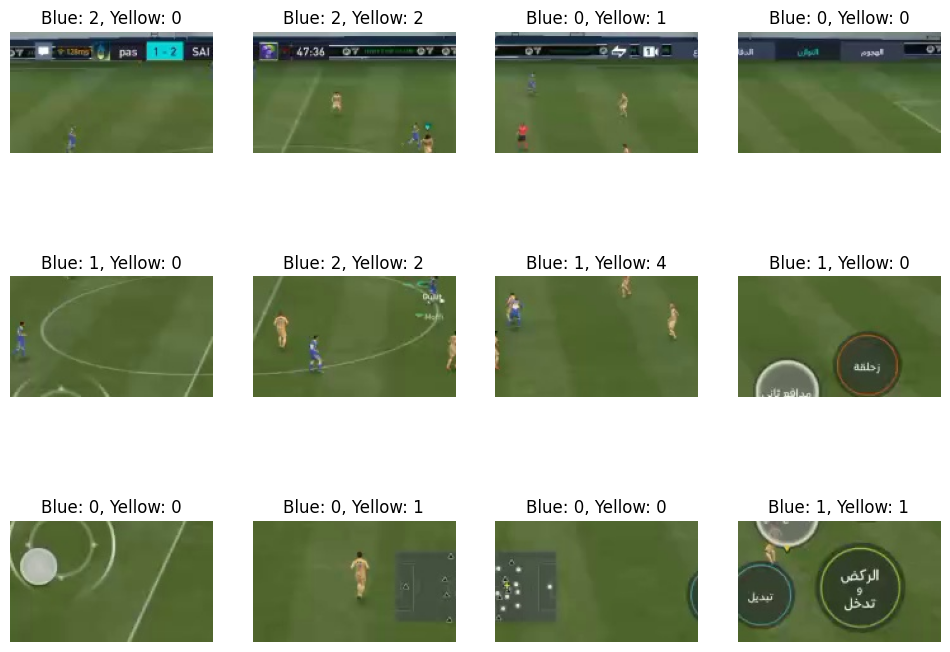

In [ ]:
img = cv2.imread("frame0.jpg")
img2 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
crops = []
width = img2.shape[1]
height = img2.shape[0]
cx = width // 4
cy = height // 3

# Define blue and yellow players (x, y)
blue_players = [(11, 149), (50, 87), (160, 36), (207, 158), (288, 84), (300, 104), (339, 133), (508, 194), (529, 178)]
yellow_players = [(184, 145), (225, 58), (247, 239), (297, 94), (320, 165), (332, 118), (422, 59), (424, 98), (461, 132), (507, 221)]

for j in range(3):
    for i in range(4):
        x = i * cx
        y = j * cy

        # Count blue players in crop
        blue_count = 0
        for player in blue_players:
            if player[0] >= x and player[1] >= y and player[0] <= x + cx and player[1] <= y + cy:
                blue_count += 1

        # Count yellow players in crop
        yellow_count = 0
        for player in yellow_players:
            if player[0] >= x and player[1] >= y and player[0] <= x + cx and player[1] <= y + cy:
                yellow_count += 1

        crops.append({'crop': img2[y:y+cy, x:x+cx], 'blue_count': blue_count, 'yellow_count': yellow_count})

plt.figure(figsize=(12, 9))

for i in range(len(crops)):
    if i < 12:
        plt.subplot(3, 4, i+1)
        plt.imshow(crops[i]['crop'])
        plt.title(f"Blue: {crops[i]['blue_count']}, Yellow: {crops[i]['yellow_count']}")
        plt.axis('off')

plt.show()